# Working with XDF data using MNE
The goal of this notebook is to import data saved using the LSL Lab Recorder, and run through some pre-processing steps using [MNE-Python](https://mne.tools/stable/index.html)!

In [1]:
import mne
import matplotlib.pyplot as plt
import pyxdf
import numpy as np
import time
import librosa # optional, only needed to convert MIDI keys to notes

## Path to dataset

This experiment involved three participants, where:
- one subject played the piano, while being observed by
- two other subjects (one expert and one novice musician)

Three ~10 minute runs were recorded:
- Run 1: random notes
- Run 2: basic melodies
- Run 3: more advanced pieces

In [2]:
DATA_PATH = r'/Volumes/GoogleDrive/.shortcut-targets-by-id/1mvHxk9Ra9K7MmjQxaRYiZKwUw4Y8o841/AC23/DATA/passive_piano/data/sub-CMP/ses-S001/eeg/'
DATA_PATH+= 'sub-CMP_ses-S001_task-Default_run-001_eeg.xdf'

In [3]:
# Read in the LSL streams from the XDF file
START_TIME = time.time()
streams, header = pyxdf.load_xdf(DATA_PATH) # this could take ~17 seconds..
print(f'Loaded in {time.time() - START_TIME} s')

Loaded in 20.420655965805054 s


The following LSL streams were recorded:
- CGX channel data (x 3)
- CGX impedance data (x 3)
- Glove
- Time-stamps for DVS alignement
- Mic

In [4]:
len(streams)

9

## Check the duration of each recorded stream

In [5]:
for s in streams:
    name = s['info']['name']
    
    first_timestamp = s['time_stamps'][0]
    last_timestamp = s['time_stamps'][-1]
    print(name, first_timestamp, last_timestamp -first_timestamp)

['ev_ts'] 1061646.239956732 594.1014887294732
['glove_data'] 1061645.539068455 595.020513759926
['MIDIStream'] 1061671.436380126 559.5842775718775
['CGX Quick-32r Q32r-0510 Impedance'] 1061645.51966225 595.160598548362
['CGX Quick-32r Q32r-0510'] 1061645.5196696813 595.178578638006
['CGX Quick-20r v2 Q20r-0537'] 1061645.53323099 595.0447412489448
['CGX Quick-20r v2 Q20r-0537 Impedance'] 1061645.5333178076 595.0485199717805
['CGX Quick-32r Q32r-0524 Impedance'] 1061645.5733182535 595.044801027514
['CGX Quick-32r Q32r-0524'] 1061645.5734055778 595.0445607902948


In [6]:
# Get the last EEG headset to start streaming data, and use that as t=0
last_eeg_start_times = []

for s in streams: # loop through remaining streams
    
    s_name = s['info']['name'][0]
    #print(s_name)
    
    if 'CGX' in s_name:
        t0 = s['time_stamps'][0]
        #print(t0, '\t', s_name)
        last_eeg_start_times.append(t0)
        #print(last_eeg_start_times)
    
t0 = max(last_eeg_start_times) # start when the last EEG stream started (prevents zero padding)
print(t0, '\t', '<== earliest')   

1061645.5734055778 	 <== earliest


# Collect stream info and data

In [7]:
# Identify EEG data and impedance streams separately to collect metadata (channel names, etc)
# Remaining streams are collected in one dict

# Dict to collect headset data by subject
eeg_t = {}
eeg_data = {}
eeg_sfreq = {}
eeg_ch_names = {}
eeg_ch_units = {}
z_t = {}
z_data = {}
z_sfreq = {}
z_ch_names = {}
z_ch_units = {}

lsl_streams = {} # for collecting time stamps and data for all misc. LSL streams

for s in streams:
    s_name = s['info']['name'][0]
    s_type = s['info']['type'][0]
    print(f'Stream Name: {s_name}\tType: {s_type}')
    print('-'*50)
    
    # Get the EEG data stream for CGX
    if ('CGX' in s_name) and (s_type == 'EEG'):
        cgx_name = s_name.split('-')[-1]
        
        # offset by start of last CGX stream
        eeg_time_stamps = s['time_stamps'] - t0
        
        # remove data before t0:
        eeg_t[cgx_name] = eeg_time_stamps[eeg_time_stamps >= 0]
        eeg_data[cgx_name] = s['time_series'][eeg_time_stamps >= 0]
        
        eeg_ch_names[cgx_name] = [ch['label'][0] for ch in s['info']['desc'][0]['channels'][0]['channel']]
        eeg_ch_units[cgx_name] = [ch['unit'][0] for ch in s['info']['desc'][0]['channels'][0]['channel']]
        eeg_sfreq[cgx_name] = s['info']['effective_srate']
        
        print(f'Channels: {eeg_ch_names[cgx_name]}')
        print(f'Unit: {eeg_ch_units[cgx_name]}')
        print(f'Eff. Sampling Rate: {eeg_sfreq[cgx_name]} Hz')
        
    # Get the impedance data stream for CGX
    elif ('CGX' in s_name) and (s_type == 'Impeadance'): # typo in the stream name?
        cgx_name = s_name.split('-')[-1].split(' ')[0]
        
        # offset by start of last CGX stream
        z_time_stamps = s['time_stamps'] - t0
        
        # remove data before t0:
        z_t[cgx_name] = z_time_stamps[z_time_stamps >= 0]
        z_data[cgx_name] = s['time_series'][z_time_stamps >= 0]
        
        z_ch_names[cgx_name] = [ch['label'][0] for ch in s['info']['desc'][0]['channels'][0]['channel']]
        z_ch_units[cgx_name] = [ch['unit'][0] for ch in s['info']['desc'][0]['channels'][0]['channel']]
        z_sfreq[cgx_name] = s['info']['effective_srate']
        print(f'Channels: {z_ch_names[cgx_name]}')
        print(f'Unit: {z_ch_units[cgx_name]}')
        print(f'Eff. Sampling Rate: {z_sfreq[cgx_name]} Hz')
        
    # Misc streams
    else:
        lsl_streams[s_type] = {}
        
        # offset by start of last CGX stream
        lsl_time_stamps = s['time_stamps'] - t0
        
        # remove data before t0
        lsl_streams[s_type]['time'] = lsl_time_stamps[lsl_time_stamps >= 0]
        lsl_streams[s_type]['data'] = s['time_series'][lsl_time_stamps >= 0]
        
        if 'effective_srate' in s['info'].keys():
            lsl_sfreq = s['info']['effective_srate']
            lsl_streams[s_type]['effective_srate'] = lsl_sfreq
            print(f'Eff. Sampling Rate: {lsl_sfreq} Hz')
            
        print('shape:', lsl_streams[s_type]['data'].shape)
        
    print('='*50)

Stream Name: ev_ts	Type: timestamp
--------------------------------------------------
Eff. Sampling Rate: 0.9998294597956898 Hz
shape: (595, 1)
Stream Name: glove_data	Type: imu_data
--------------------------------------------------
Eff. Sampling Rate: 99.9931913138909 Hz
shape: (59495, 6)
Stream Name: MIDIStream	Type: MIDI
--------------------------------------------------
Eff. Sampling Rate: 0 Hz
shape: (1034, 6)
Stream Name: CGX Quick-32r Q32r-0510 Impedance	Type: Impeadance
--------------------------------------------------
Channels: ['AF7-Z', 'Fpz-Z', 'F7-Z', 'Fz-Z', 'T7-Z', 'FC6-Z', 'Fp1-Z', 'F4-Z', 'C4-Z', 'Oz-Z', 'CP6-Z', 'Cz-Z', 'PO8-Z', 'CP5-Z', 'O2-Z', 'O1-Z', 'P3-Z', 'P4-Z', 'P7-Z', 'P8-Z', 'Pz-Z', 'PO7-Z', 'T8-Z', 'C3-Z', 'Fp2-Z', 'F3-Z', 'F8-Z', 'FC5-Z', 'AF8-Z', 'A2-Z', 'ExG 1-Z', 'ExG 2-Z', 'ACC32-Z', 'ACC33-Z', 'ACC34-Z', 'Packet Counter-Z', 'TRIGGER-Z']
Unit: ['kohms', 'kohms', 'kohms', 'kohms', 'kohms', 'kohms', 'kohms', 'kohms', 'kohms', 'kohms', 'kohms', 'kohms', 

In [8]:
print(sum(eeg_data['0524'][:, -1]>0)) # number of events in trigger channel (mic)
np.unique(eeg_data['0524'][:, -1]) # types of trigger events seen

58321


array([    0.,  8192., 16384., 24576.], dtype=float32)

Event | Description
:-- | --:
Audio Left | 8192
Audio Right | 16384
Audio Left+Right | 24576

(is the mic outputting stereo?)

# Visualize EEG data for entire run

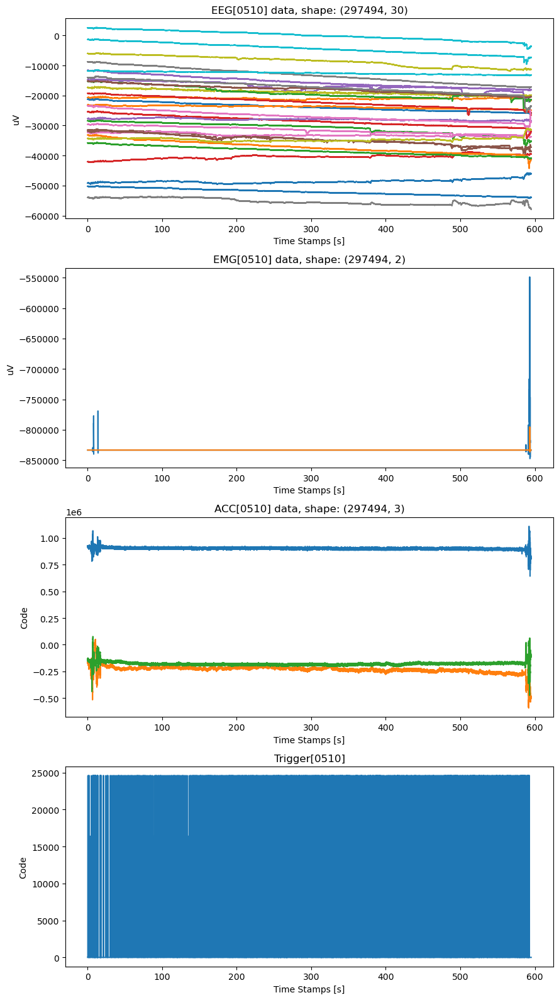

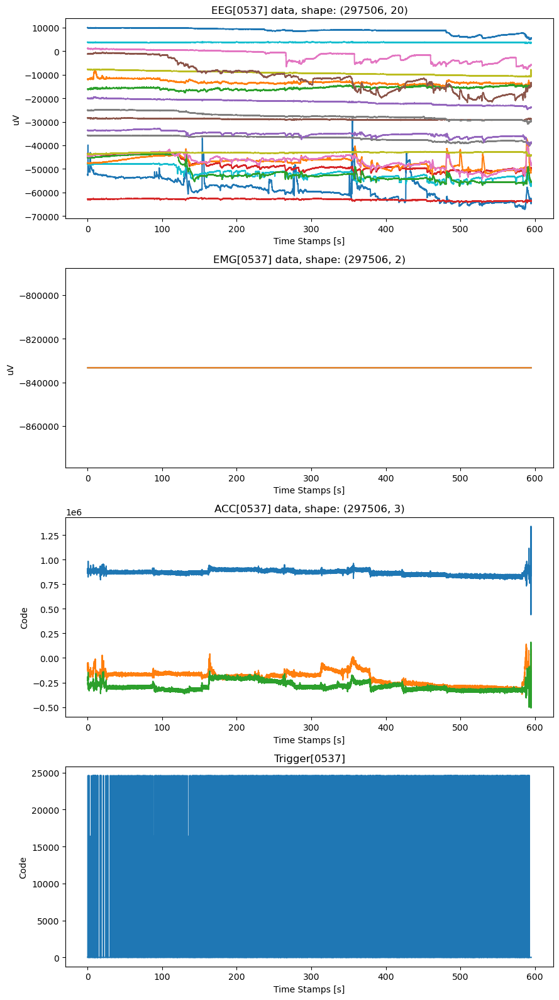

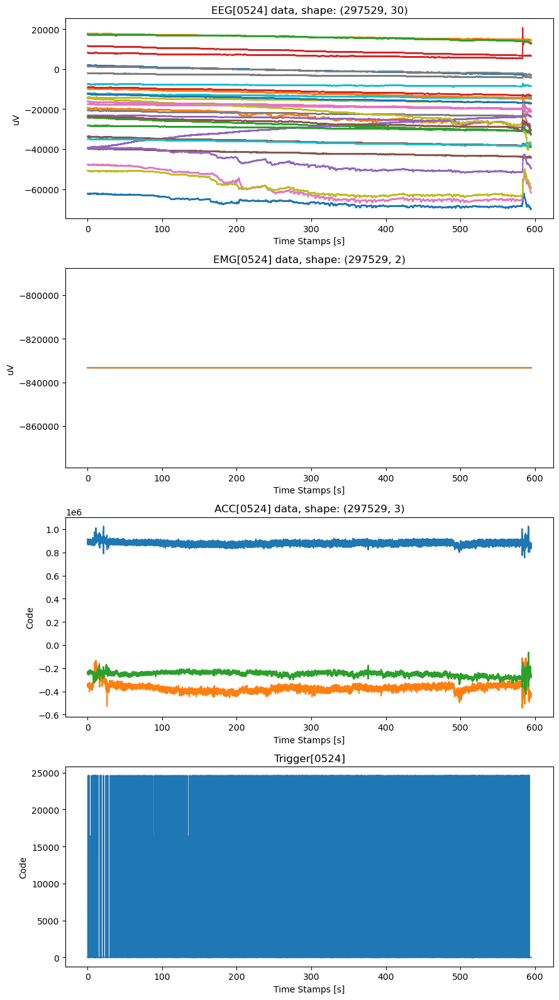

In [9]:
for cgx_name in eeg_data:
    
    # Plot EEG data
    fig, ax = plt.subplots(4, 1, figsize=(9, 16))

    i = 0
    ax[i].plot(eeg_t[cgx_name], eeg_data[cgx_name][:, :-7])
    ax[i].set_ylabel('uV')
    ax[i].set_xlabel('Time Stamps [s]')
    ax[i].set_title(f'EEG[{cgx_name}] data, shape: {eeg_data[cgx_name][:, :-7].shape}')

    i += 1
    ax[i].plot(eeg_t[cgx_name], eeg_data[cgx_name][:, -7:-5])
    ax[i].set_ylabel('uV')
    ax[i].set_xlabel('Time Stamps [s]')
    ax[i].set_title(f'EMG[{cgx_name}] data, shape: {eeg_data[cgx_name][:, -7:-5].shape}')

    i += 1
    ax[i].plot(eeg_t[cgx_name], eeg_data[cgx_name][:, -5:-2])
    ax[i].set_ylabel('Code')
    ax[i].set_xlabel('Time Stamps [s]')
    ax[i].set_title(f'ACC[{cgx_name}] data, shape: {eeg_data[cgx_name][:, -5:-2].shape}')

    # skip packet counter plot

    i += 1
    ax[i].plot(eeg_t[cgx_name], eeg_data[cgx_name][:, -1])
    ax[i].set_ylabel('Code')
    ax[i].set_xlabel('Time Stamps [s]')
    ax[i].set_title(f'Trigger[{cgx_name}]')

    '''
    # Plot event markers
    for i in range(len(events)):
        event_t = events_t[i]
        event_v = events[i][0]
        event_type = events[i][1]

        if event_type == 'left':
            ax[0].axvline(x = event_t, c='pink')
        elif event_type == 'right':
            ax[0].axvline(x = event_t, c='c')
        elif event_type == 'enter':
            ax[0].axvline(x = event_t, c='r')

    ax[1].plot(z_t, z_data)
    ax[1].set_ylabel('kOhms')
    ax[1].set_title('Impedance')

    '''

    plt.tight_layout()
    plt.show()

# Prepare to import data to mne

In [10]:
eeg_sfreq

{'0510': 499.88358269483683,
 '0537': 500.00609931158095,
 '0524': 500.00961202901084}

In [11]:
# Are the starting samples time-aligned now?
print('\t'.join(['CGX', 'Start Time [ms]', 'Duration [ms]', 'Shape']))
for cgx_name in eeg_t:
    print(
        '{}\t{:.6f}\t{:.6f}\t{}'.format(
            cgx_name,
            eeg_t[cgx_name][0]*1e3, # * eeg_sfreq[cgx_name], 
            eeg_t[cgx_name][-1]*1e3, # * eeg_sfreq[cgx_name], 
            eeg_data[cgx_name].shape,
         )
    )
    print(
        '{}\t{:.6f}\t{:.6f}\t{}'.format(
            cgx_name,
            z_t[cgx_name][0]*1e3, # * z_sfreq[cgx_name],
            z_t[cgx_name][-1]*1e3, # * z_sfreq[cgx_name],
            z_data[cgx_name].shape,
         )
    )
    
# Looks like we might still be off by one sample...

CGX	Start Time [ms]	Duration [ms]	Shape
0510	0.276680	595124.842742	(297494, 37)
0510	0.269250	595106.855221	(297485, 37)
0537	1.824900	595004.566661	(297506, 27)
0537	1.911702	595008.432202	(297508, 27)
0524	0.000000	595044.560790	(297529, 37)
0524	1.912638	595044.713703	(297528, 37)


## Rescale EEG data to V
(only run this once!)

In [12]:
for cgx_name in eeg_data:
    print(eeg_data[cgx_name][:, 0])

    # Rescale units of eeg_data to V
    if 'microvolts' in eeg_ch_units[cgx_name]:
        eeg_data[cgx_name][:, :-5] /= 1e6 # only rescale EEG and ExG channels

    print(eeg_data[cgx_name][:, 0])

[-49160.062 -49158.19  -49162.04  ... -46098.89  -46105.406 -46108.8  ]
[-0.04916006 -0.04915819 -0.04916204 ... -0.04609889 -0.04610541
 -0.0461088 ]
[-52282.387 -52275.492 -52271.68  ... -64283.7   -64296.08  -64297.363]
[-0.05228239 -0.05227549 -0.05227168 ... -0.0642837  -0.06429608
 -0.06429736]
[-62275.758 -62278.94  -62272.9   ... -69844.766 -69829.32  -69815.25 ]
[-0.06227576 -0.06227894 -0.0622729  ... -0.06984477 -0.06982932
 -0.06981525]


(Manually) Identify each channel's type for importing data to mne:

In [13]:
ch_types = {}

for cgx_name in eeg_data:
    
    ch_types[cgx_name] = []
    # Use index of A2 to determine how many eeg channels we have (changes between Quick20 and Quick32)
    nchans = eeg_ch_names[cgx_name].index('A2') + 1 # include A2 in eeg channels
    
    ch_types[cgx_name].extend(['eeg']*nchans) # all channels upto and including A2
    ch_types[cgx_name].extend(['misc']*(2+3+1)) # ExG x2, ACC x3, Packet Counter)
    ch_types[cgx_name].extend(['stim']) # Trigger channel (probably unused)

# Import data as an array of raw objects
Each participant get its own raw object

Creating RawArray with float64 data, n_channels=37, n_times=297494
    Range : 0 ... 297493 =      0.000 ...   595.125 secs
Ready.


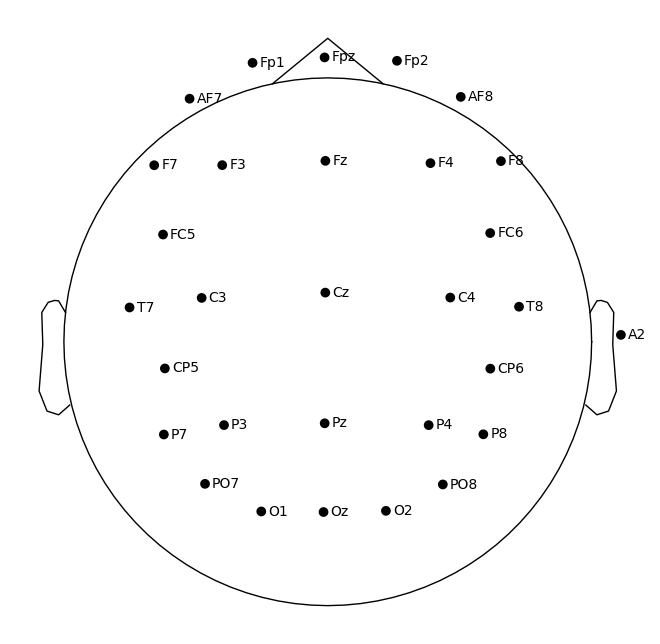

Creating RawArray with float64 data, n_channels=27, n_times=297506
    Range : 0 ... 297505 =      0.000 ...   595.003 secs
Ready.


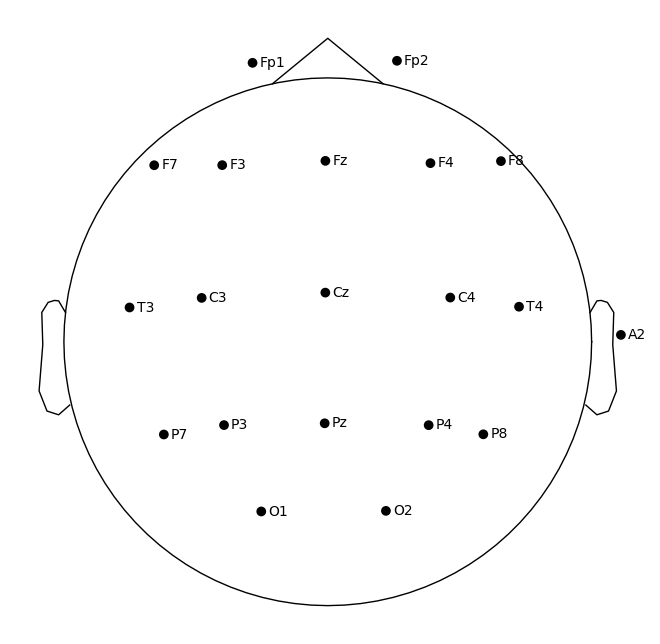

Creating RawArray with float64 data, n_channels=37, n_times=297529
    Range : 0 ... 297528 =      0.000 ...   595.045 secs
Ready.


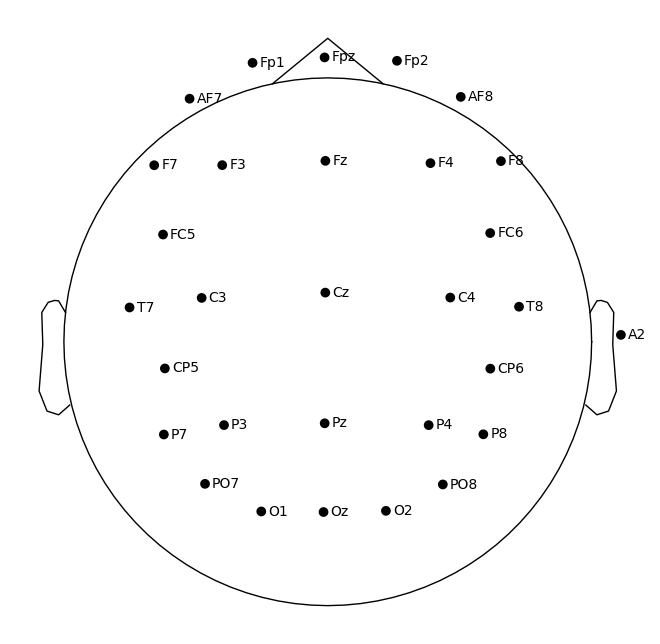

In [14]:
raws = [] # hold raw data for all subjects

for cgx_name in eeg_data:
    
    # Make an info object for importing data to mne:
    # https://mne.tools/stable/generated/mne.create_info.html
    info = mne.create_info(
        ch_names = eeg_ch_names[cgx_name],
        sfreq = eeg_sfreq[cgx_name],
        ch_types = ch_types[cgx_name],
    )
    
    # Import the data as a raw array:
    # https://mne.tools/stable/generated/mne.io.RawArray.html
    raw = mne.io.RawArray(
        data = eeg_data[cgx_name].T, # mne expects (n_channels, n_times)
        info = info,
    )
    
    # Apply the 10-20 channel montage
    raw.info.set_montage('standard_1020', match_case=False)
    
    # Plot the montage
    mne.viz.plot_montage(raw.info.get_montage())
    
    raws.append(raw)

In [15]:
raws

[<RawArray | 37 x 297494 (595.1 s), ~84.0 MB, data loaded>,
 <RawArray | 27 x 297506 (595.0 s), ~61.3 MB, data loaded>,
 <RawArray | 37 x 297529 (595.0 s), ~84.0 MB, data loaded>]

# Add annotations from MIDI stream

In [16]:
lsl_streams['MIDI']

{'time': array([ 25.86297455,  25.896415  ,  25.89644706, ..., 584.74084771,
        584.79941744, 585.44725212]),
 'data': array([[  0,   1,  72,  72,  97,  97],
        [  0,   1,  60,  60,  93,  93],
        [  0,   1,  55,  55, 100, 100],
        ...,
        [  0,   1,  53,  53,  82,  82],
        [  0,   0,  55,  55,  64,  64],
        [  0,   0,  53,  53,  64,  64]], dtype=int32),
 'effective_srate': 0}

In [17]:
# Total number of error events
sum(lsl_streams['MIDI']['data'][:, 0])

57

In [18]:
# All "ON" events
lsl_streams['MIDI']['data'][lsl_streams['MIDI']['data'][:, 0] == 1]

array([[ 1,  0, 69, 68, 64, 64],
       [ 1,  1, 58, 57, 87, 87],
       [ 1,  0, 58, 57, 64, 64],
       [ 1,  1, 60, 59, 86, 86],
       [ 1,  0, 67, 64, 64, 64],
       [ 1,  1, 65, 62, 84, 84],
       [ 1,  1, 62, 59, 78, 78],
       [ 1,  0, 62, 65, 64, 64],
       [ 1,  1, 55, 58, 87, 87],
       [ 1,  0, 67, 70, 64, 64],
       [ 1,  0, 55, 58, 64, 64],
       [ 1,  1, 59, 62, 81, 81],
       [ 1,  0, 60, 59, 64, 64],
       [ 1,  1, 51, 50, 79, 79],
       [ 1,  0, 55, 54, 64, 64],
       [ 1,  0, 67, 68, 64, 64],
       [ 1,  1, 62, 63, 89, 89],
       [ 1,  0, 61, 62, 64, 64],
       [ 1,  1, 63, 64, 90, 90],
       [ 1,  0, 54, 53, 64, 64],
       [ 1,  1, 61, 60, 81, 81],
       [ 1,  0, 60, 59, 64, 64],
       [ 1,  1, 57, 56, 87, 87],
       [ 1,  1, 55, 57, 73, 73],
       [ 1,  0, 54, 56, 64, 64],
       [ 1,  0, 55, 57, 64, 64],
       [ 1,  1, 71, 73, 86, 86],
       [ 1,  1, 67, 69, 84, 84],
       [ 1,  0, 57, 59, 64, 64],
       [ 1,  1, 57, 59, 87, 87],
       [ 1

## Parse MIDI events

In [19]:
midi_q = {}
midi_events = []
error_events = []

for i, msg in enumerate(lsl_streams['MIDI']['data']):
    
    # Parse the MIDI message
    mapping_error = msg[0]
    on_or_off = msg[1]
    played_note = msg[2]
    heard_note = msg[3]
    note = f'{played_note}->{heard_note}'
    played_velocity = msg[4]
    heard_velocity = msg[5]
    
    # Collect any feedback error event onsets
    if mapping_error:
        error_events.append(
            [
                lsl_streams['MIDI']['time'][i], # onset time
                0, # setting duration as 0 for now
                'error',
            ]
        )
    
    # Also collect durations of played notes
    if not note in midi_q:
        on_t = lsl_streams['MIDI']['time'][i]
        midi_q[note] = {}
        midi_q[note]['onset'] = on_t
        midi_q[note]['velocity'] = played_velocity
        
    else: # note is already ON
        if on_or_off == 0: # OFF event
            off_t = lsl_streams['MIDI']['time'][i]
            midi_events.append(
                [
                    midi_q[note]['onset'], # start time
                    off_t - midi_q[note]['onset'], # duration
                    librosa.midi_to_note(int(note.split('->')[0])) 
                    + '->' 
                    + librosa.midi_to_note(int(note.split('->')[1]))
                ]
            )
            midi_q.pop(note, None) # remove note from the queue
            
midi_events = np.array(midi_events) # for easier indexing
midi_events

array([['25.89644706249237', '1.9733712745364755', 'G3->G3'],
       ['25.896414997056127', '1.985117037082091', 'C4->C4'],
       ['25.86297454824671', '2.0245869560167193', 'C5->C5'],
       ...,
       ['583.5001771566458', '0.14239452732726932', 'F3->F3'],
       ['583.5713952335063', '1.228022204246372', 'G3->G3'],
       ['584.7408477107529', '0.7064044093713164', 'F3->F3']],
      dtype='<U32')

In [20]:
error_events = np.array(error_events)
error_events

array([['43.500988335115835', '0', 'error'],
       ['43.52349880011752', '0', 'error'],
       ['44.55707704182714', '0', 'error'],
       ['44.76564929750748', '0', 'error'],
       ['87.86538936174475', '0', 'error'],
       ['88.06334249582142', '0', 'error'],
       ['89.36568581406027', '0', 'error'],
       ['131.12364266742952', '0', 'error'],
       ['132.35761753981933', '0', 'error'],
       ['132.45560944802128', '0', 'error'],
       ['133.53528331359848', '0', 'error'],
       ['133.61443298566155', '0', 'error'],
       ['204.91175191733055', '0', 'error'],
       ['205.16393002984114', '0', 'error'],
       ['205.20509769394994', '0', 'error'],
       ['232.79915733402595', '0', 'error'],
       ['233.88200026471168', '0', 'error'],
       ['233.8977306059096', '0', 'error'],
       ['234.9928992446512', '0', 'error'],
       ['259.88438683212735', '0', 'error'],
       ['260.8527053752914', '0', 'error'],
       ['260.9152598087676', '0', 'error'],
       ['261.8936629

In [21]:
# Total notes played
len(midi_events)

473

In [22]:
# Total number of playback errors
len(error_events)

57

## Add MIDI events / errors as annotations to all raws
https://mne.tools/stable/auto_tutorials/raw/30_annotate_raw.html

In [23]:
note_annot = mne.Annotations(
    onset = midi_events[:, 0],
    duration = midi_events[:, 1], # setting durations to 0 to just label event onsets
    description = midi_events[:, 2]
)

error_annot = mne.Annotations(
    onset = error_events[:, 0],
    duration = error_events[:, 1], # setting durations to 0 to just label event onsets
    description = error_events[:, 2]
)

for raw in raws:
    raw.set_annotations(note_annot + error_annot)

# Time plots
(before filtering)

Using matplotlib as 2D backend.


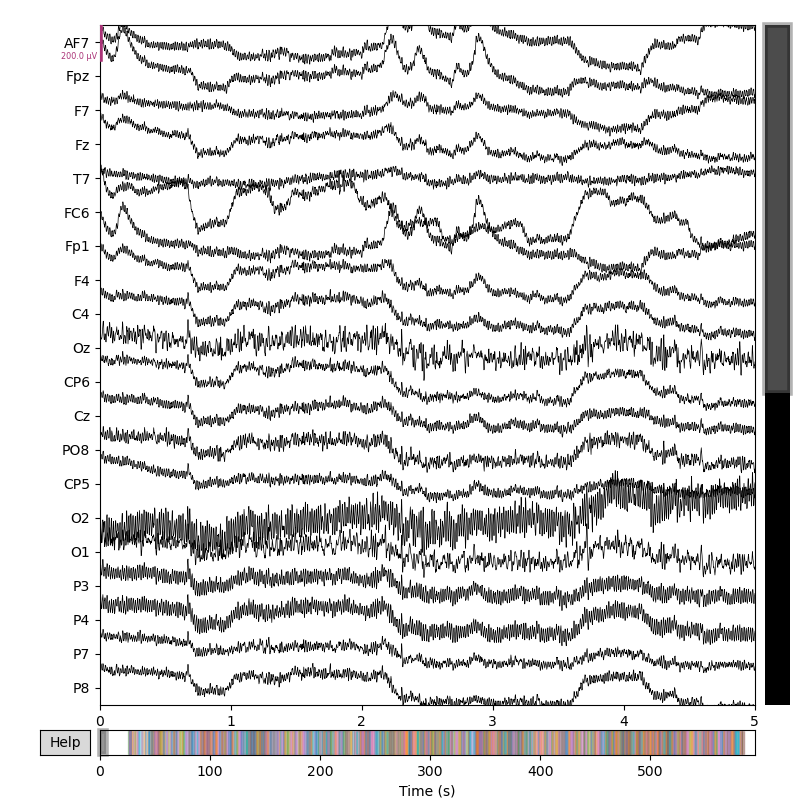

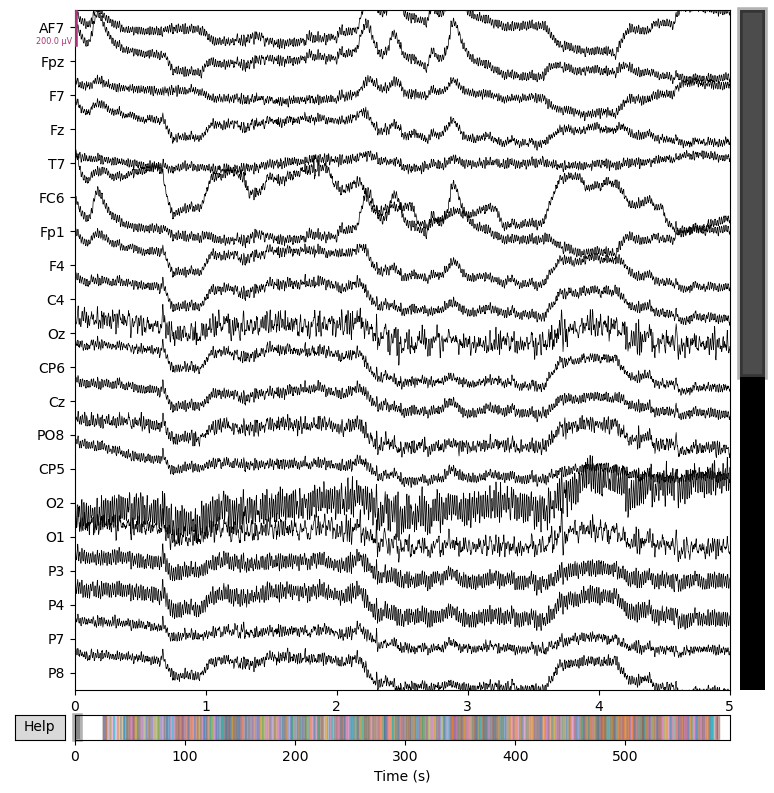

In [24]:
%matplotlib widget

# could go back to 
# %matplotlib inline 
# if the plot doubling becomes annoying

# using widget to make the plot interactive (for scrolling, bad channel selection, etc)

# scaling can help with visibility, especially if we have some bad channels / artifacts
scalings = {
    'eeg': 100e-6, 
    'eog': 500e-6,
    'misc': 100
} 

# In case you want to manually flag some channels as bad (could also click in the plot)
bad_chans = []
raw.info['bads'] = bad_chans

PLOT_WINDOW_START_s = 0
PLOT_WINDOW_DUR_s = 5

# Just plot one subject to visualize annotations
raw.plot(
    scalings = scalings,
    #butterfly = True,
    start = PLOT_WINDOW_START_s,
    duration = PLOT_WINDOW_DUR_s,
)

# Manually reject bad data segments
(skip for now)

In [25]:
if 0: 
    bad_annot = mne.Annotations(
        onset = [7, 11, ],
        duration = [3, 19, ], # setting durations to 0 to just label event onsets
        description = "bad",
    )

    #raw.set_annotations(raw.annotations + bad_annot)
    raw.set_annotations(lsl_annot + bad_annot)
    
    # Plot again
    raw.plot(
        scalings = scalings,
        butterfly = True,
        start = PLOT_WINDOW_START_s,
        duration = PLOT_WINDOW_DUR_s,
    )

In [26]:
# Remove any erroneous annotations (if needed)
# raw.annotations[5]
# raw.annotations.delete(5)

# Power Spectra
(before filtering)

Effective window size : 2.048 (s)


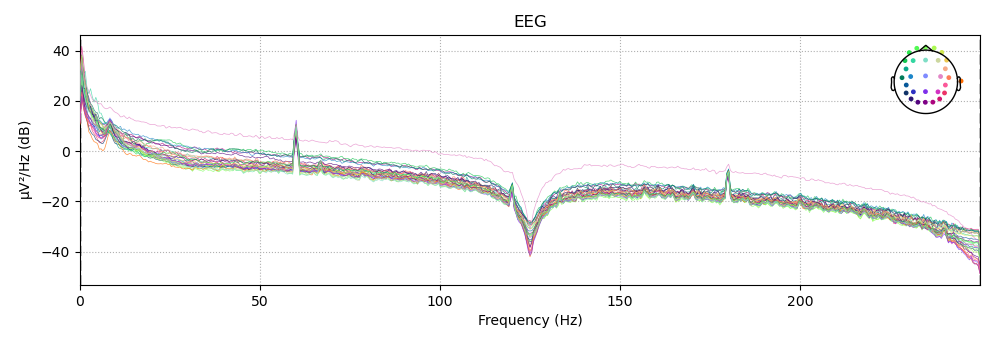

Effective window size : 2.048 (s)


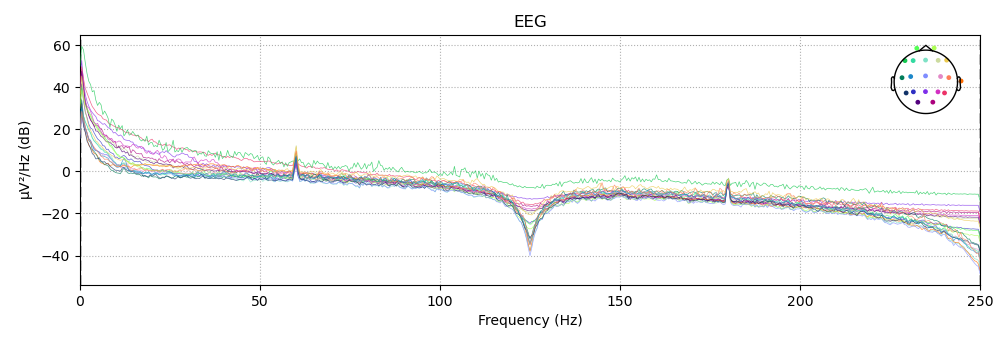

Effective window size : 2.048 (s)


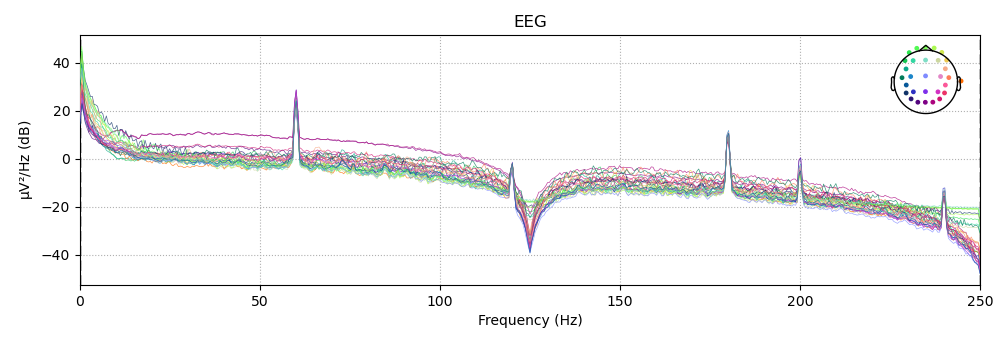

In [27]:
for raw in raws:
    raw.compute_psd(n_fft = 1024).plot(average = False)

Let's bandpass filter the data:

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1651 samples (3.303 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.4s finished


Effective window size : 2.048 (s)


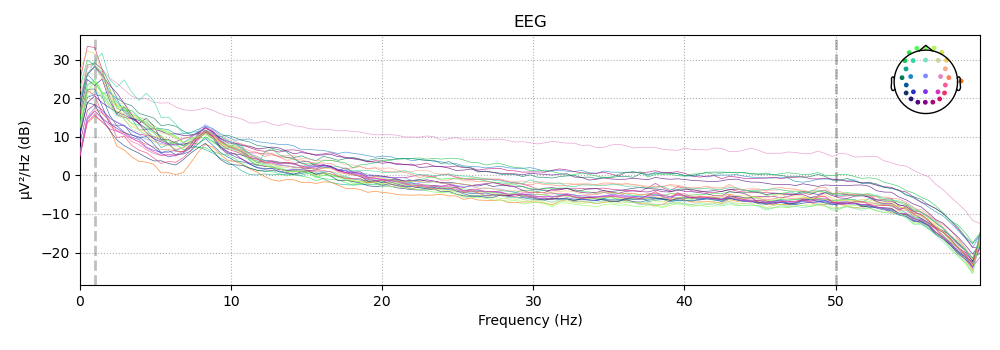

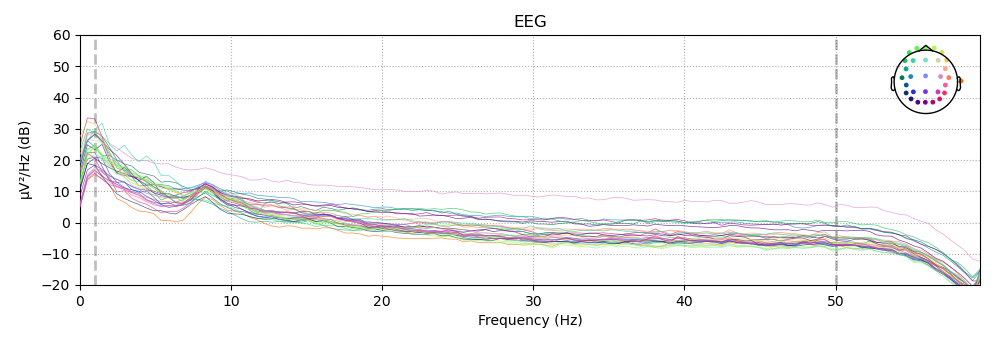

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1651 samples (3.302 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Effective window size : 2.048 (s)


[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    0.3s finished


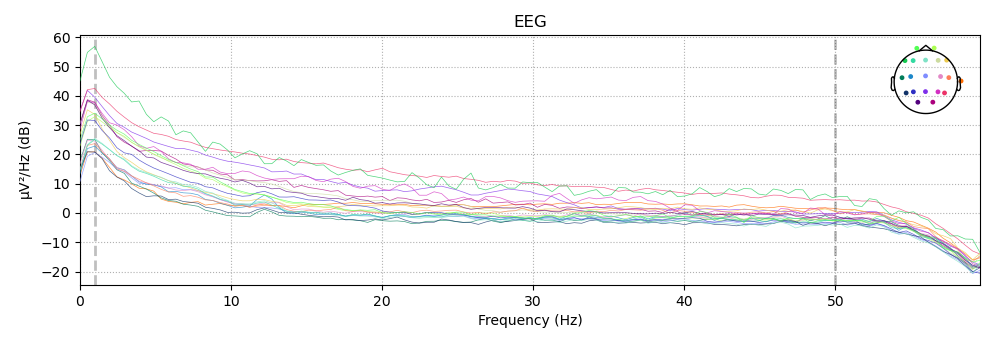

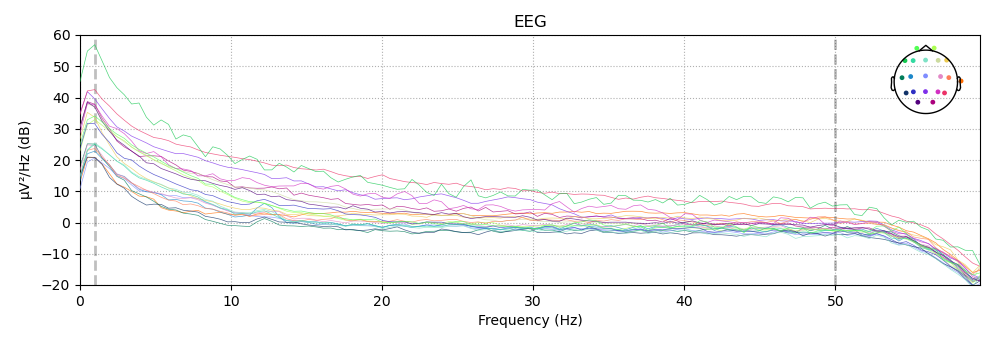

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1651 samples (3.302 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.4s finished


Effective window size : 2.048 (s)


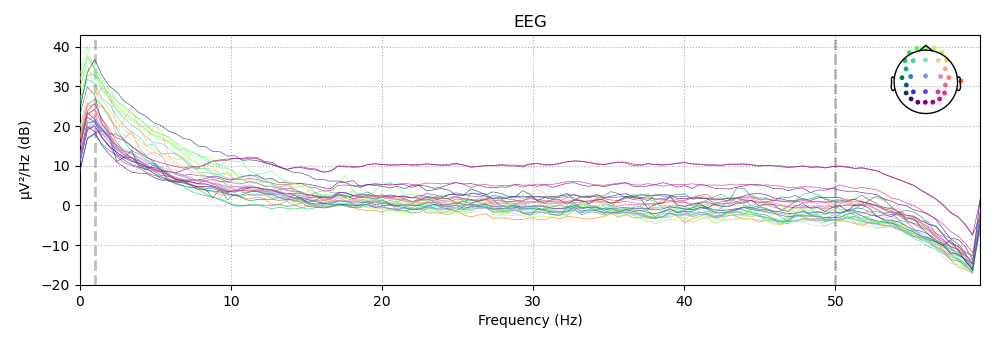

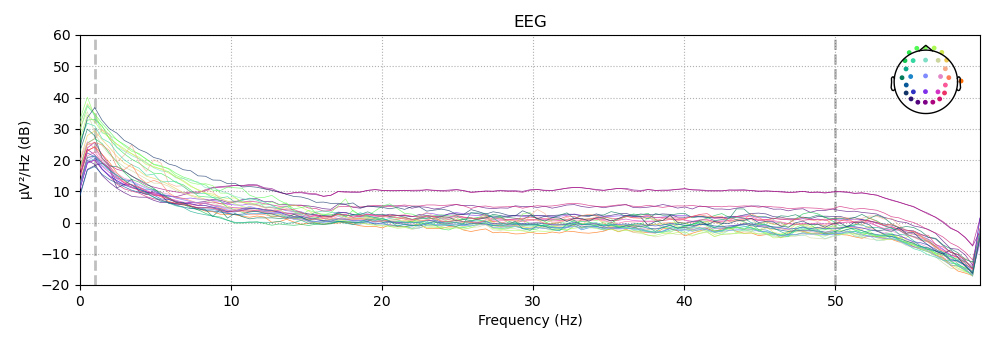

In [28]:
l_freq = 1
h_freq = 50

raws_preproc = []

for raw in raws:
    raw_filt = raw.copy().filter( # make a copy of the array to avoid modifying in place
        l_freq = l_freq, # lower cut-off, in Hz
        h_freq = h_freq, # upper cut-off, in Hz
    )
    
    raws_preproc.append(raw_filt)

    # And look at the PSD again
    n_fft = 1024
    
    fig = raw_filt.compute_psd(
        fmin = 0, # lower limit to plot
        fmax = 60, # upper limit to plot
        n_fft = n_fft
    ).plot(average = False)
    
    # Set the same yaxis scale for all subjects
    fig.get_axes()[0].set_ylim([-20, 60])

    plt.show()

# Identify any bad channels
(skip for now)

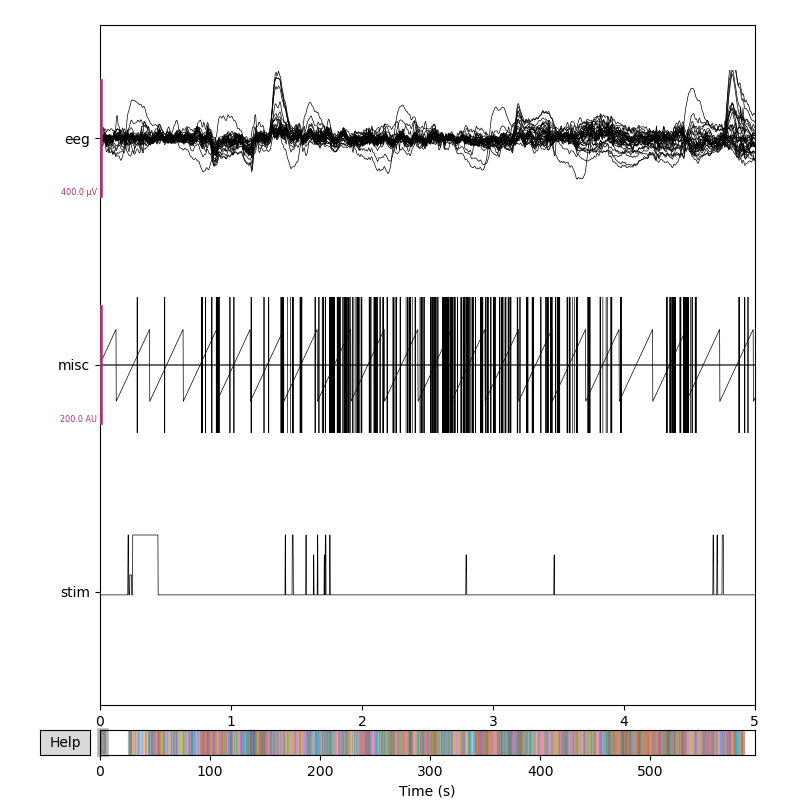

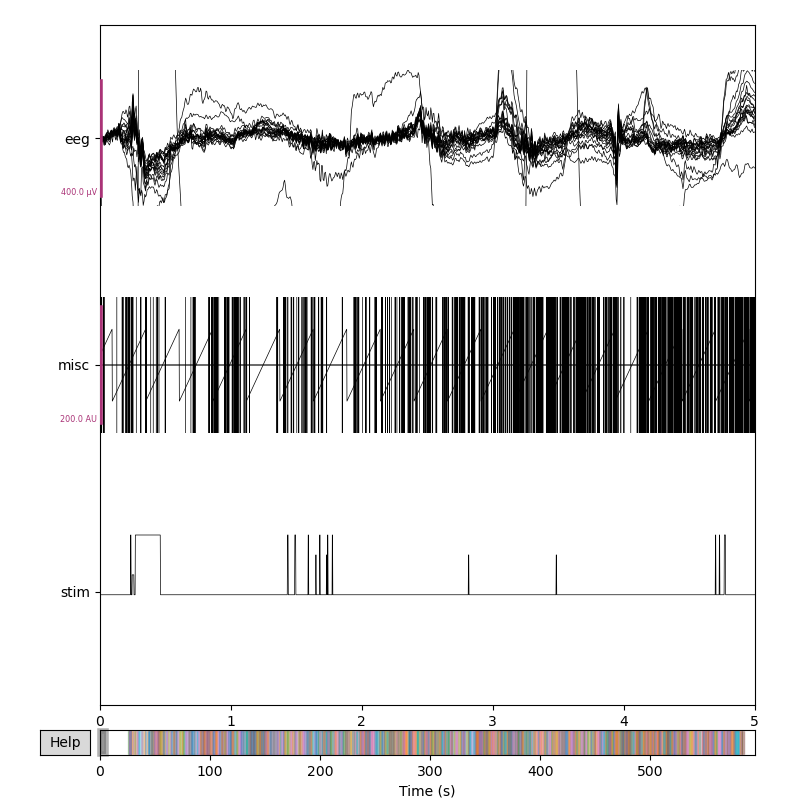

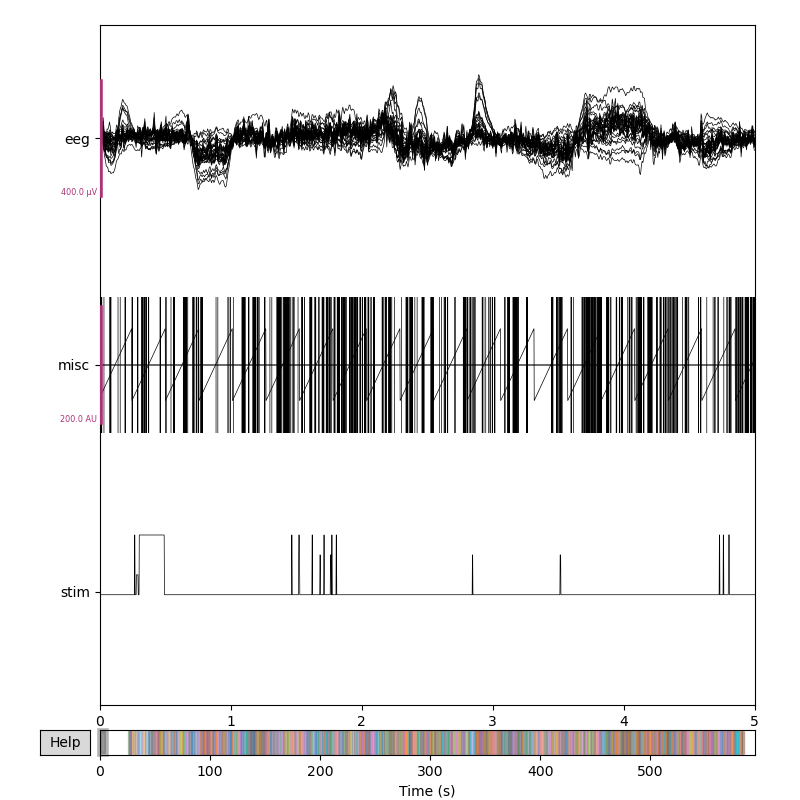

In [29]:
## Update scalings if needed
scalings['eeg'] = 200e-6 
# scalings['eog'] = 500e-6
# scalings['misc'] = 100

for raw_pp in raws_preproc:
    raw_pp.info.bads = [] #'Oz', 'PO8', 'Fp2', 'F7', 'P3'] # ideally could label bad segments instead of dropping channels

    # Drop bad channels from visual examination before running ICA
    raw_pp = raw_pp.drop_channels(raw_pp.info.bads)

    raw_pp.plot(
        scalings = scalings,
        butterfly = True,
        start = PLOT_WINDOW_START_s,
        duration = PLOT_WINDOW_DUR_s,
)

## Re-reference to average? Skip for now.
https://mne.tools/stable/generated/mne.set_eeg_reference.html

Re-referencing to average seems to just output noise...

In [30]:
if 0:
    for raw_pp in raws_preproc:

        raw_pp, _ = mne.set_eeg_reference(
            raw_pp, 
            ref_channels=['A2'], # 'average'
        )

        raw_pp.plot(
            scalings=scalings,
            butterfly=True,
            start = PLOT_WINDOW_START_s,
            duration = PLOT_WINDOW_DUR_s,
        )

# Lets find events from annotations

In [31]:
events, event_ids = mne.events_from_annotations(raw_pp)

Used Annotations descriptions: ['A3->A3', 'A4->A4', 'A♯2->A♯2', 'A♯3->A3', 'A♯3->A♯3', 'A♯4->A♯4', 'B3->B3', 'B4->B4', 'C3->C3', 'C4->B3', 'C4->C4', 'C5->C5', 'C♯3->C♯3', 'C♯4->C♯4', 'D3->D3', 'D4->D4', 'D5->D5', 'D♯3->C♯3', 'D♯3->D♯3', 'D♯4->D♯4', 'E3->E3', 'E4->E4', 'F3->F3', 'F4->F4', 'F5->F5', 'F♯3->F♯3', 'F♯3->G♯3', 'F♯4->F♯4', 'G3->A3', 'G3->A♯3', 'G3->F3', 'G3->G3', 'G4->G4', 'G♯3->G♯3', 'G♯4->G♯4', 'error']


In [32]:
events

array([[ 12932,      0,     12],
       [ 12948,      0,     11],
       [ 12948,      0,     32],
       ...,
       [291765,      0,     21],
       [291791,      0,     32],
       [292376,      0,     23]])

In [33]:
# These are event IDs, not event counts!
event_ids

{'A3->A3': 1,
 'A4->A4': 2,
 'A♯2->A♯2': 3,
 'A♯3->A3': 4,
 'A♯3->A♯3': 5,
 'A♯4->A♯4': 6,
 'B3->B3': 7,
 'B4->B4': 8,
 'C3->C3': 9,
 'C4->B3': 10,
 'C4->C4': 11,
 'C5->C5': 12,
 'C♯3->C♯3': 13,
 'C♯4->C♯4': 14,
 'D3->D3': 15,
 'D4->D4': 16,
 'D5->D5': 17,
 'D♯3->C♯3': 18,
 'D♯3->D♯3': 19,
 'D♯4->D♯4': 20,
 'E3->E3': 21,
 'E4->E4': 22,
 'F3->F3': 23,
 'F4->F4': 24,
 'F5->F5': 25,
 'F♯3->F♯3': 26,
 'F♯3->G♯3': 27,
 'F♯4->F♯4': 28,
 'G3->A3': 29,
 'G3->A♯3': 30,
 'G3->F3': 31,
 'G3->G3': 32,
 'G4->G4': 33,
 'G♯3->G♯3': 34,
 'G♯4->G♯4': 35,
 'error': 36}

In [34]:
# Count number of each event type
eids, counts = np.unique(events[:, 2], return_counts=True)
for i, count in enumerate(counts):
    print(eids[i], count)

1 39
2 24
3 1
4 1
5 14
6 6
7 19
8 8
9 16
10 1
11 52
12 10
13 4
14 14
15 22
16 30
17 5
18 1
19 16
20 10
21 16
22 23
23 11
24 30
25 1
26 16
27 1
28 13
29 1
30 1
31 1
32 29
33 28
34 6
35 3
36 57


Find the top 5 most frequent events:

In [35]:
NUM_ERP = 5 # number of notes to make ERPs from
TOP_EVENTS = [eids[x] for x in np.argsort(-counts)[:NUM_ERP]] # sort descending, get most frequent events
print(TOP_EVENTS)

erp_events = []
for eid in TOP_EVENTS:
    for note in event_ids: # note here is a key
        if eid == event_ids[note]: # reverse lookup the key for this frequency event ID
            print(eid, note)
            erp_events.append(note)
            
erp_events

[36, 11, 1, 16, 24]
36 error
11 C4->C4
1 A3->A3
16 D4->D4
24 F4->F4


['error', 'C4->C4', 'A3->A3', 'D4->D4', 'F4->F4']

# Epoching for ERPs

In [36]:


eps = []
for raw_pp in raws_preproc:
    ep = mne.Epochs(
        raw_pp,
        events = events, 
        event_id = event_ids, 
        tmin=-0.5,
        tmax=1,
        baseline=None,
        event_repeated = 'drop',
        preload = True,
        # reject=reject_criteria,
    )
    eps.append(ep)

Multiple event values for single event times found. Keeping the first occurrence and dropping all others.
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 513 events and 751 original time points ...
0 bad epochs dropped
Multiple event values for single event times found. Keeping the first occurrence and dropping all others.
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 513 events and 751 original time points ...
0 bad epochs dropped
Multiple event values for single event times found. Keeping the first occurrence and dropping all others.
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 513 events and 751 original time points ...
0 bad epochs dropped


Channel(s) F3 not found, nothing dropped.
Channel(s) C4 not found, nothing dropped.
Channel(s) CP5 not found, nothing dropped.
Channel(s) F4 not found, nothing dropped.
Channel(s) F7 not found, nothing dropped.
Channel(s) F8 not found, nothing dropped.
Channel(s) Pz not found, nothing dropped.
Channel(s) P3 not found, nothing dropped.
Channel(s) P4 not found, nothing dropped.
Channel(s) P8 not found, nothing dropped.
Channel(s) O2 not found, nothing dropped.
Channel(s) O1 not found, nothing dropped.
Channel(s) Fp1 not found, nothing dropped.
Channel(s) Fp2 not found, nothing dropped.
Multiple event values for single event times found. Keeping the first occurrence and dropping all others.
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 513 events and 751 original time points ...
0 bad epochs dropped
Multiple event values for single event times found. Keeping the first occurrence and dropping all

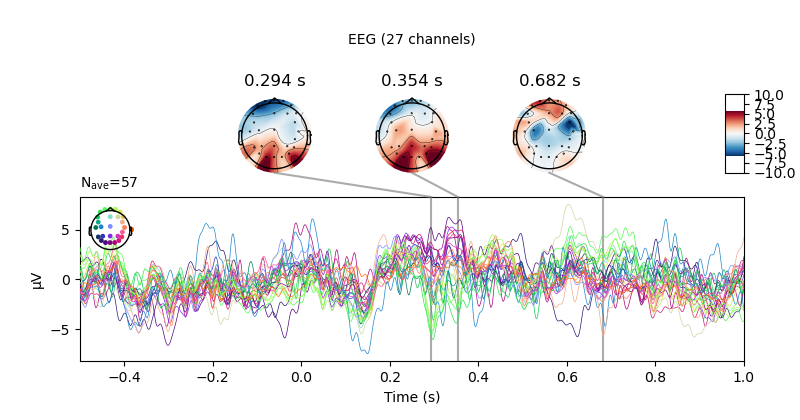

No projector specified for this dataset. Please consider the method self.add_proj.


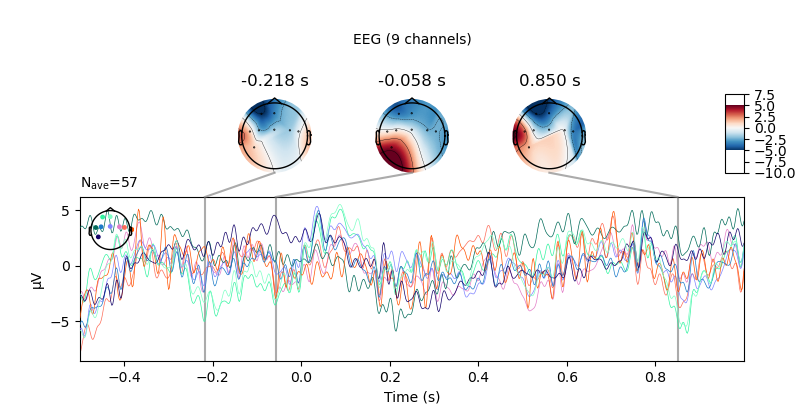

No projector specified for this dataset. Please consider the method self.add_proj.


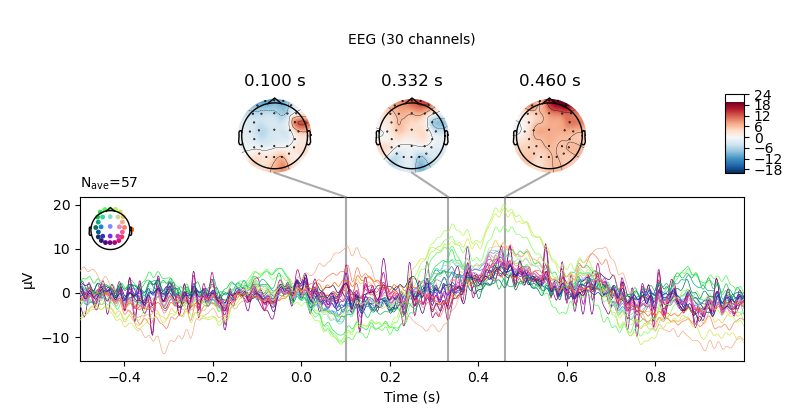

C4->C4
No projector specified for this dataset. Please consider the method self.add_proj.


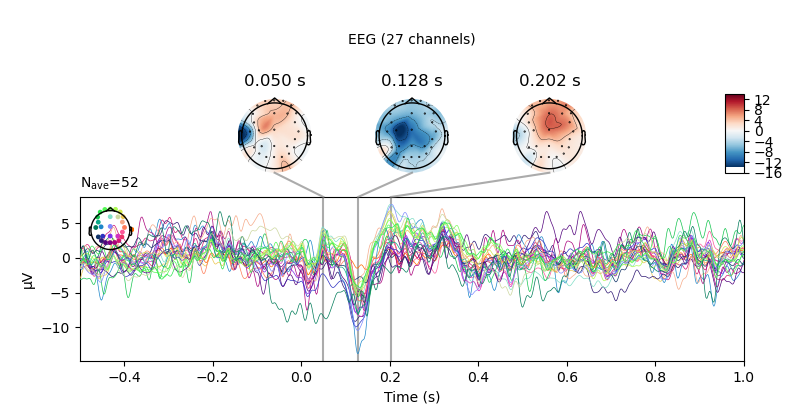

No projector specified for this dataset. Please consider the method self.add_proj.


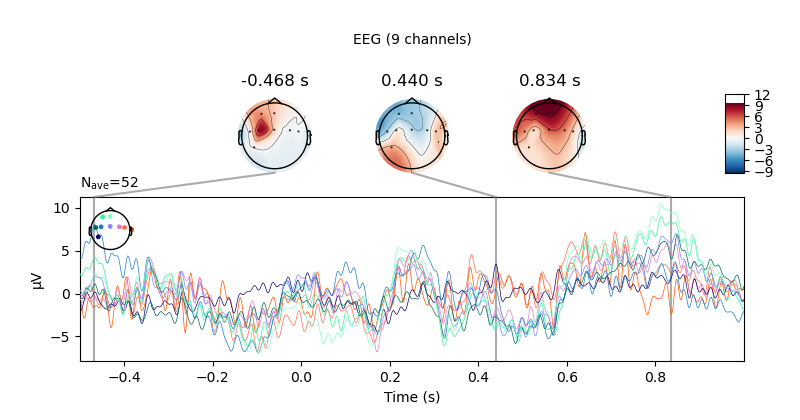

No projector specified for this dataset. Please consider the method self.add_proj.


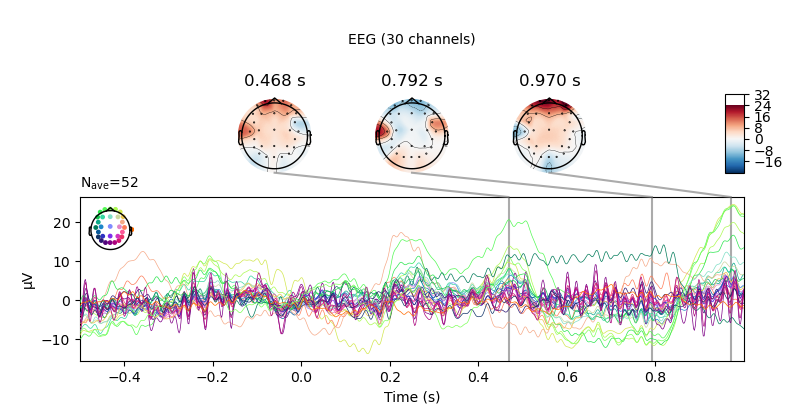

In [53]:
%matplotlib widget

# Identify and drop bad channels
raws_preproc[0].info.bads = ['F3', 'C4', 'CP5']
raws_preproc[1].info.bads = ['F4', 'F7', 'F8', 'Pz', 'P3', 'P4', 'P8', 'O2', 'O1', 'Fp1', 'Fp2']

for i in range(len(raws_preproc)):
    for ch in raws_preproc[i].info.bads:
        try:
            raws_preproc[i] = raws_preproc[i].drop_channels(ch)
        except ValueError as e:
            print(e)
            
# Make the epochs
'''
reject_criteria = dict(
    eeg=100e-6,  # 100 µV
)
'''
eps = []
for raw_pp in raws_preproc:
    ep = mne.Epochs(
        raw_pp,
        events = events, 
        event_id = event_ids, 
        tmin=-0.5,
        tmax=1,
        baseline=None,
        event_repeated = 'drop',
        # reject=reject_criteria,
        preload = True,
    )
    eps.append(ep)

for ev_id in erp_events[:2]:
    print('='*100)
    print(ev_id)
    
    for ep in eps:
        ep[ev_id].average(
            # picks = []
        ).plot_joint()

# Run ICA

In [54]:
from mne.preprocessing import ICA

icas = []

# Run ICA
for raw_pp in raws_preproc:
    
    # Make an ICA object
    ica = ICA(
        #n_components = 29, # number of prinicipal components passed to ICA
        random_state = 23, # seed for numpy RNG
        #method = 'infomax', # can use 'fastica' or 'picard' too
    )

    ica.fit(raw_pp)
    
    icas.append(ica)

Fitting ICA to data using 27 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 27 components
Fitting ICA took 12.8s.
Fitting ICA to data using 9 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 9 components
Fitting ICA took 2.8s.
Fitting ICA to data using 30 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 30 components
Fitting ICA took 22.0s.


Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated


/var/folders/st/wjnxghxn7_b382gv3l4lxt0m0000gn/T/ipykernel_4583/3236399541.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  ica.plot_sources(


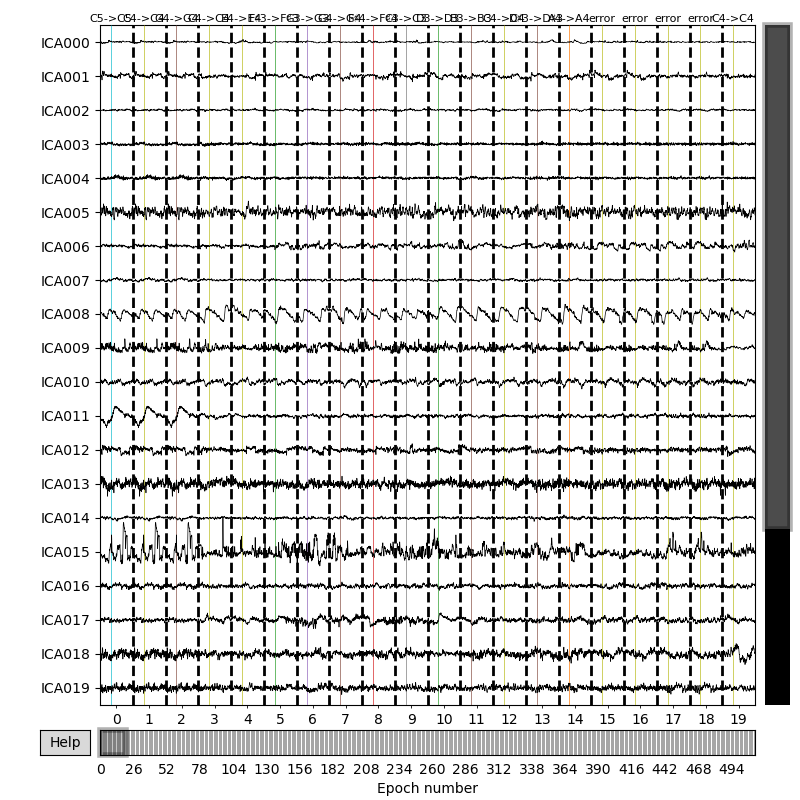

Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated


/var/folders/st/wjnxghxn7_b382gv3l4lxt0m0000gn/T/ipykernel_4583/3236399541.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  ica.plot_sources(


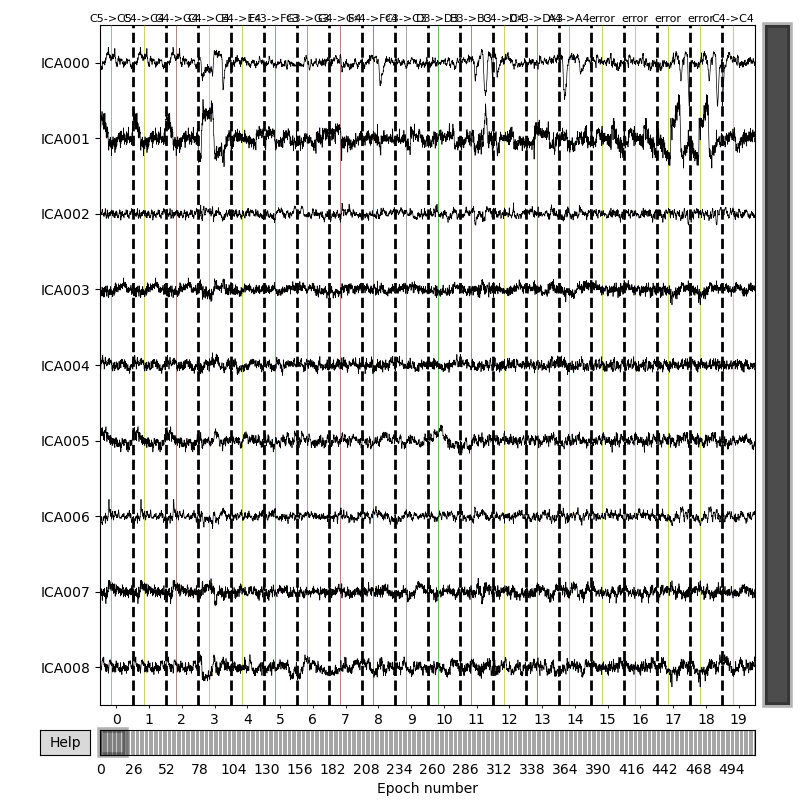

Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated


/var/folders/st/wjnxghxn7_b382gv3l4lxt0m0000gn/T/ipykernel_4583/3236399541.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  ica.plot_sources(


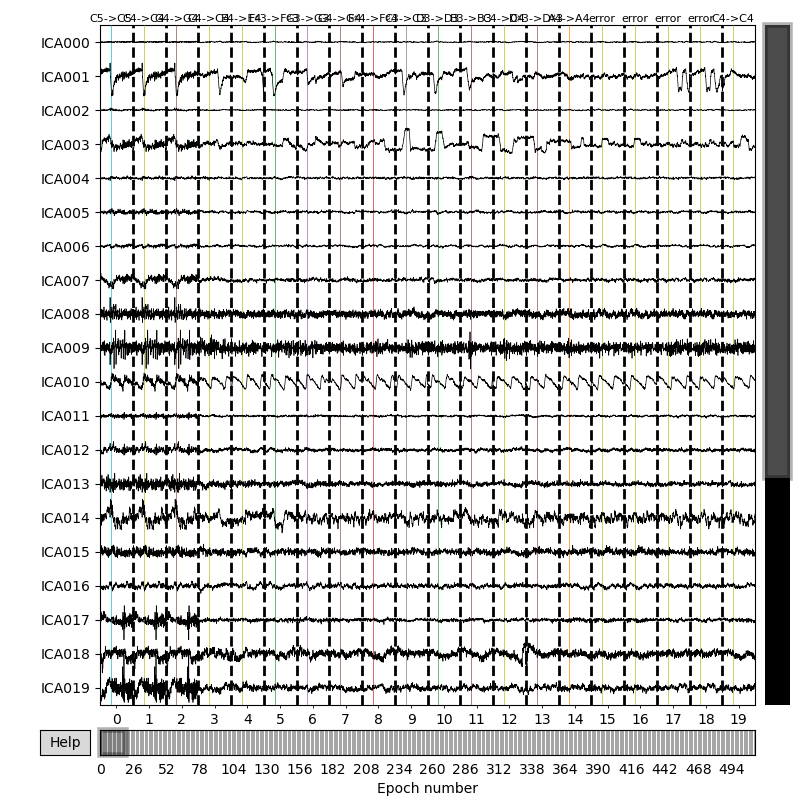

In [55]:
for i, ica in enumerate(icas):
    ica.plot_sources(
        eps[i],
        #start = PLOT_WINDOW_START_s,
        #stop = PLOT_WINDOW_START_s + PLOT_WINDOW_DUR_s,
    )

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated


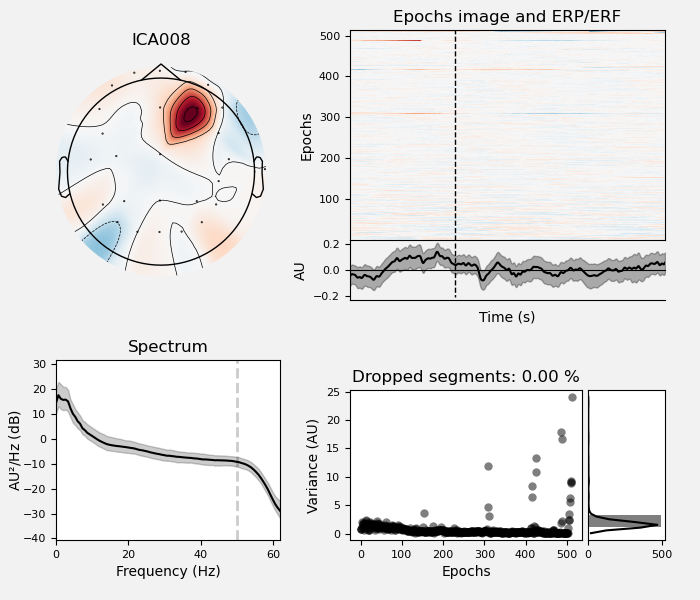

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated


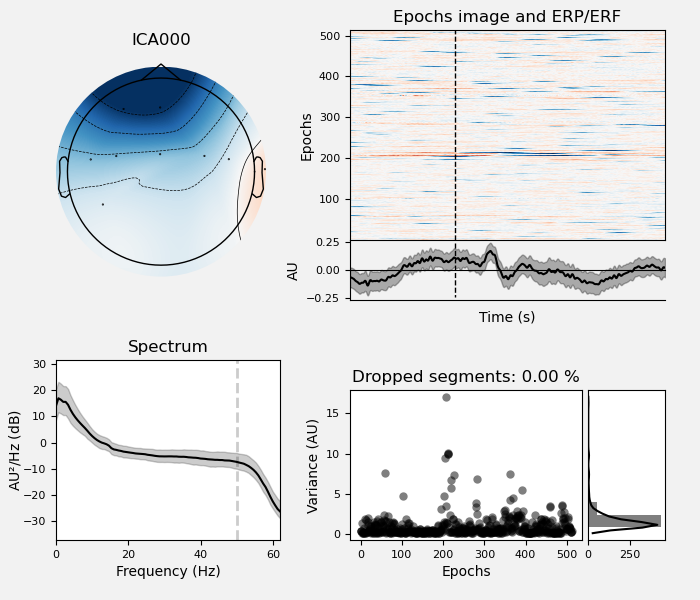

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
513 matching events found
No baseline correction applied
0 projection items activated


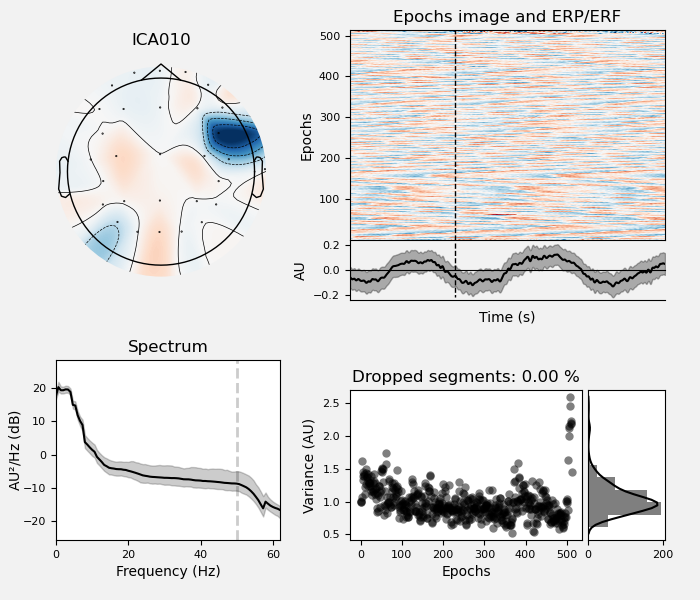

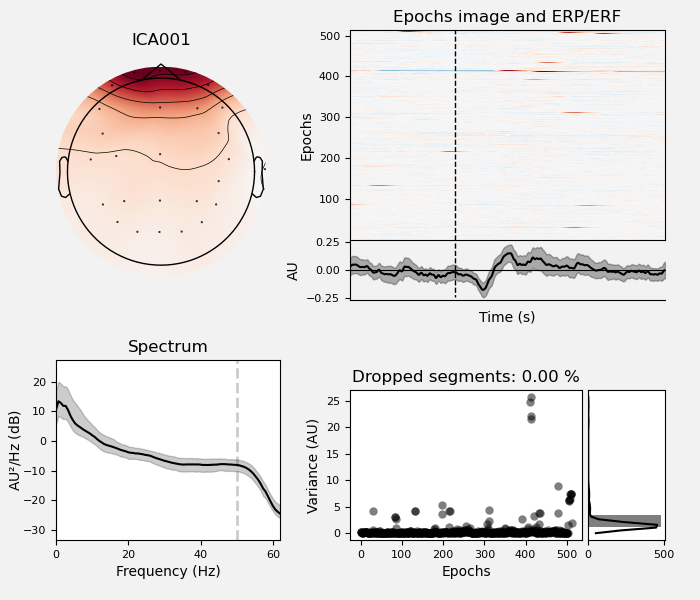

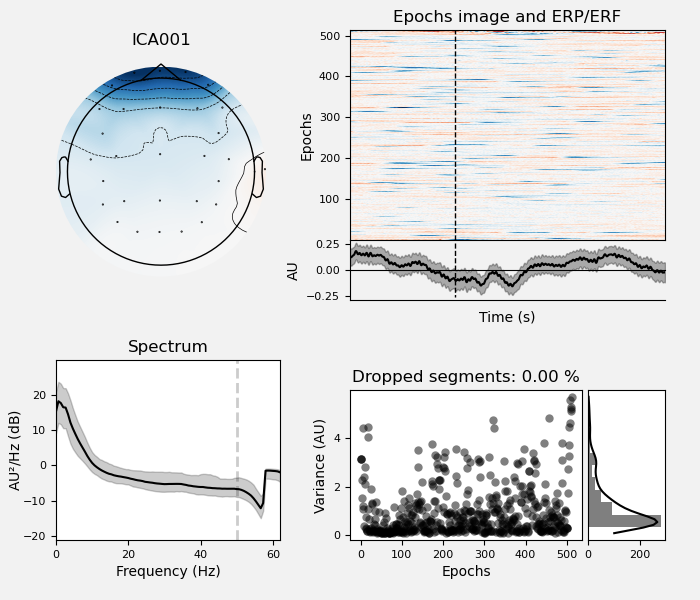

In [56]:
suspect_ica_components = []

# First subject
suspect_ica_components.append(
    [
        1, # eye movemet
        8, # pulse
    ]
)

# Second subject
suspect_ica_components.append(
    [
        0, # eye blinks
    ]
)

# Third subject
suspect_ica_components.append(
    [
        1, # eye blinks
        10, # pulse
    ]
)

for i, ica in enumerate(icas):
    print('='*100)
    ica.plot_properties(
        eps[i],
        picks = suspect_ica_components[i], # select ICA components to plot topomaps for
    )

## Remove suspect ICA components

In [57]:
for i, ica in enumerate(icas):
    eps[i] = ica.apply(
        eps[i], 
        exclude=suspect_ica_components[i], # ICA components to drop
    )

Applying ICA to Epochs instance
    Transforming to ICA space (27 components)
    Zeroing out 2 ICA components
    Projecting back using 27 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (9 components)
    Zeroing out 1 ICA component
    Projecting back using 9 PCA components
Applying ICA to Epochs instance
    Transforming to ICA space (30 components)
    Zeroing out 2 ICA components
    Projecting back using 30 PCA components


Plot ERPs again:

error
No projector specified for this dataset. Please consider the method self.add_proj.


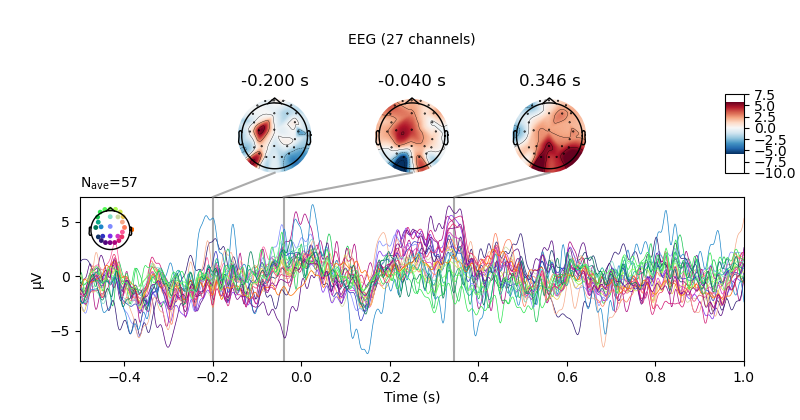

No projector specified for this dataset. Please consider the method self.add_proj.


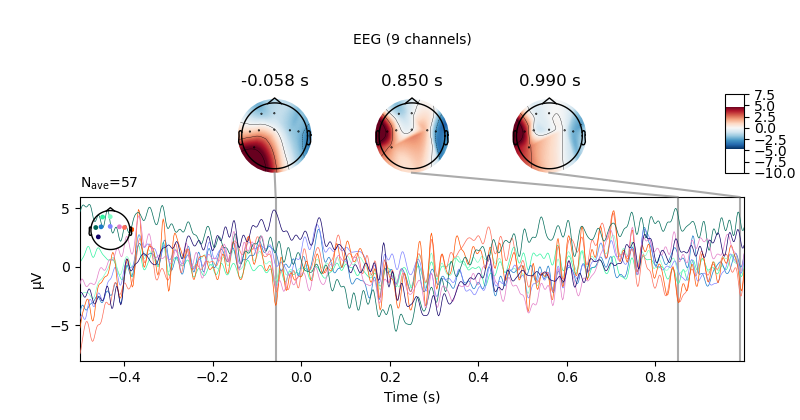

No projector specified for this dataset. Please consider the method self.add_proj.


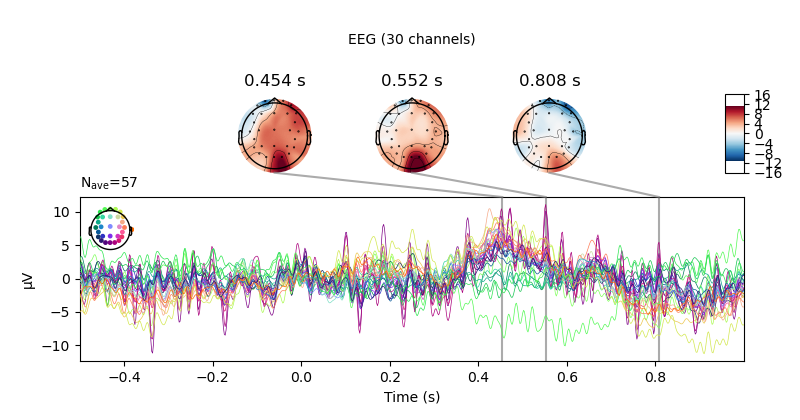

C4->C4
No projector specified for this dataset. Please consider the method self.add_proj.


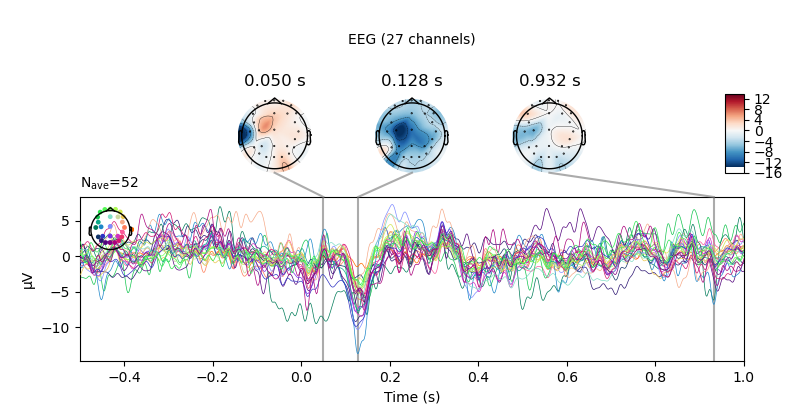

No projector specified for this dataset. Please consider the method self.add_proj.


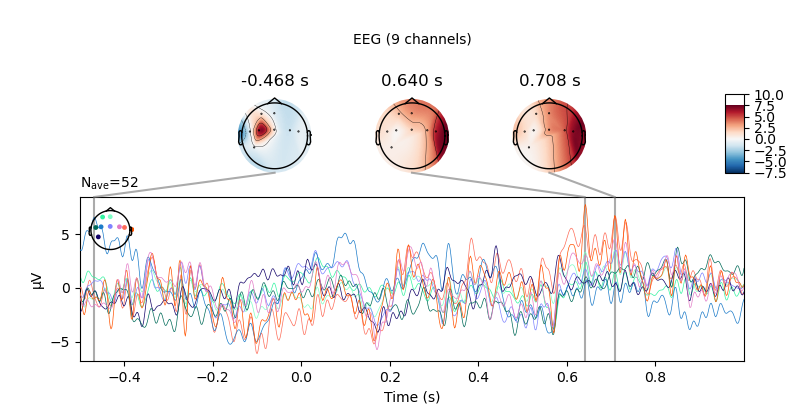

No projector specified for this dataset. Please consider the method self.add_proj.


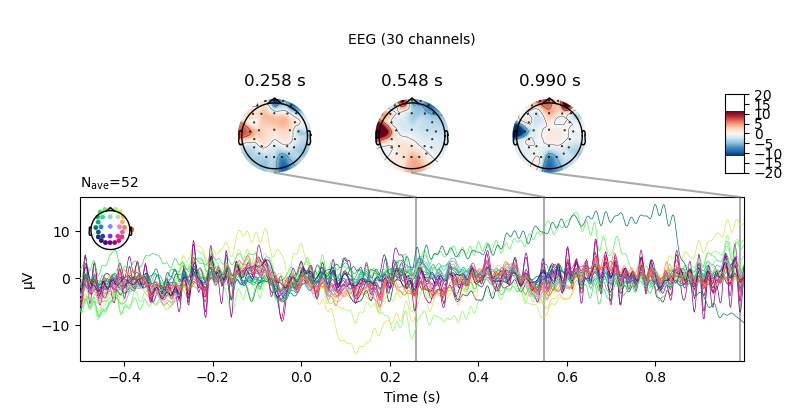

In [58]:
for ev_id in erp_events[:2]:
    print('='*100)
    print(ev_id)
    
    for ep in eps:
        ep[ev_id].average(
            # picks = []
        ).plot_joint()

error
Not setting metadata
57 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


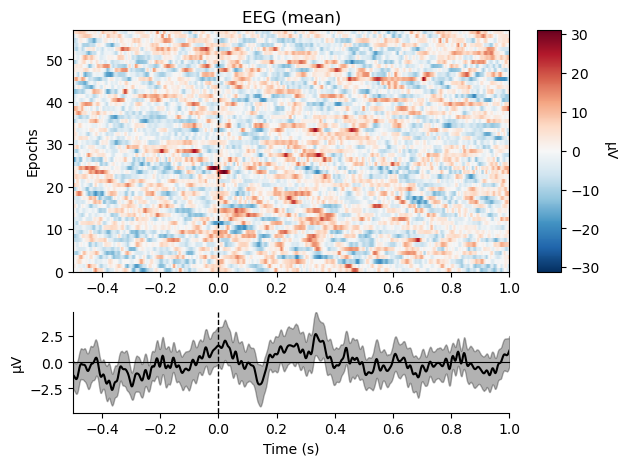

Not setting metadata
57 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


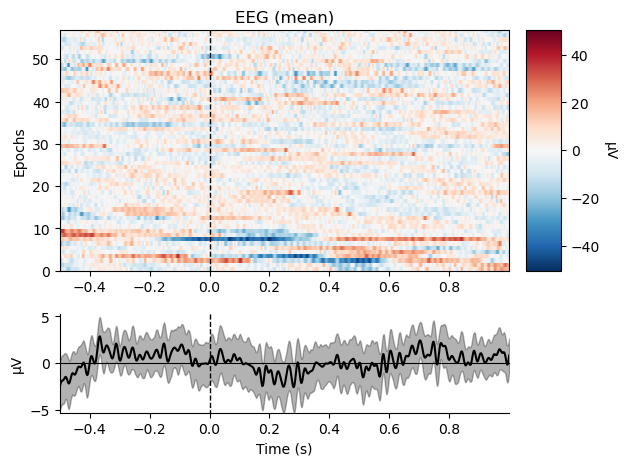

Not setting metadata
57 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


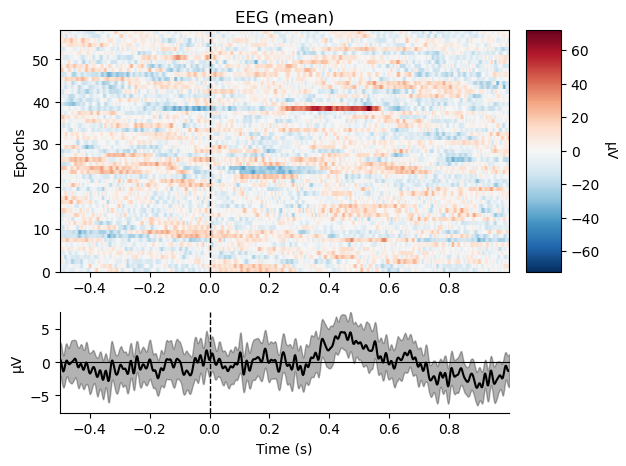

C4->C4
Not setting metadata
52 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


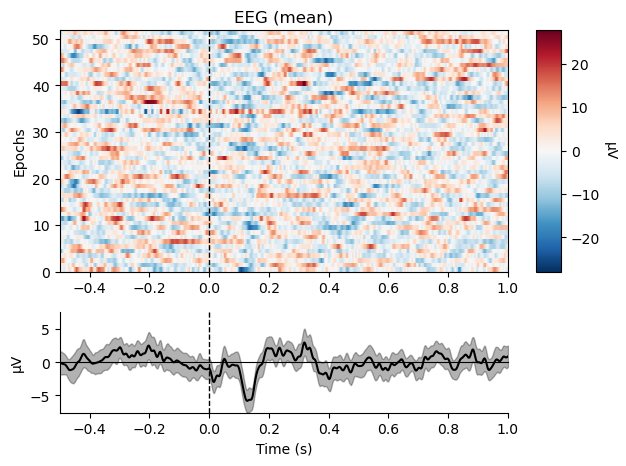

Not setting metadata
52 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


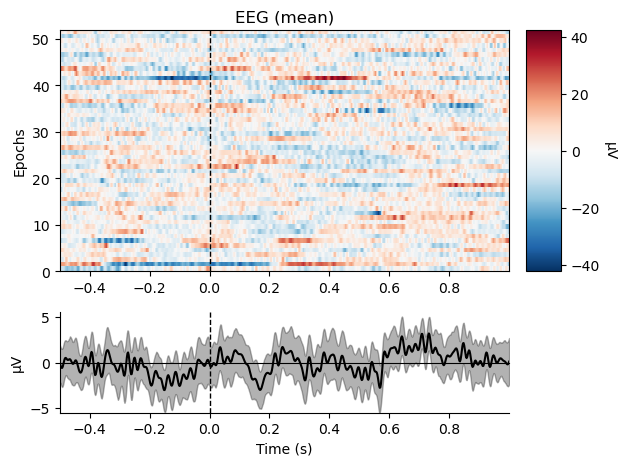

Not setting metadata
52 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


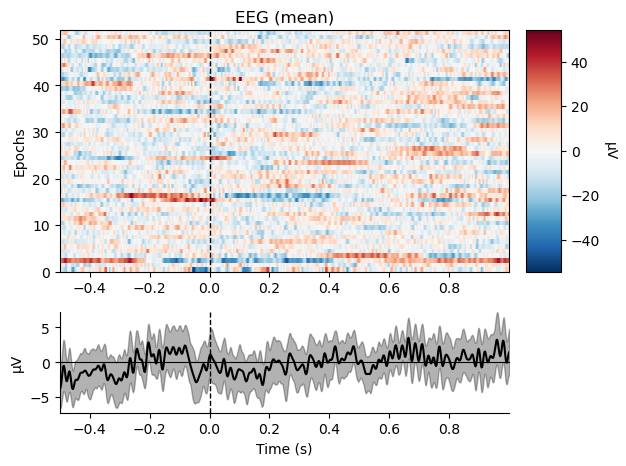

A3->A3
Not setting metadata
38 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


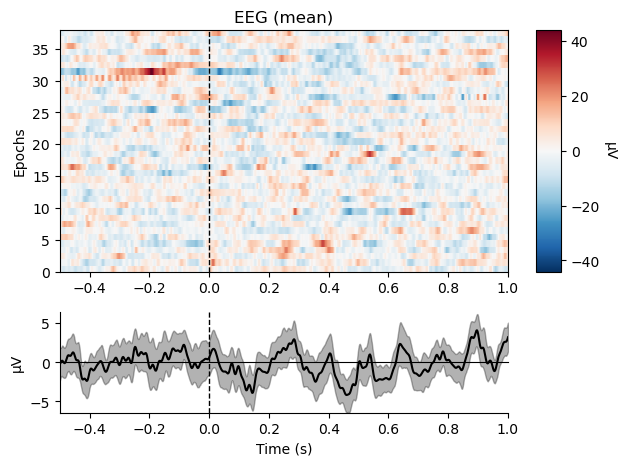

Not setting metadata
38 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


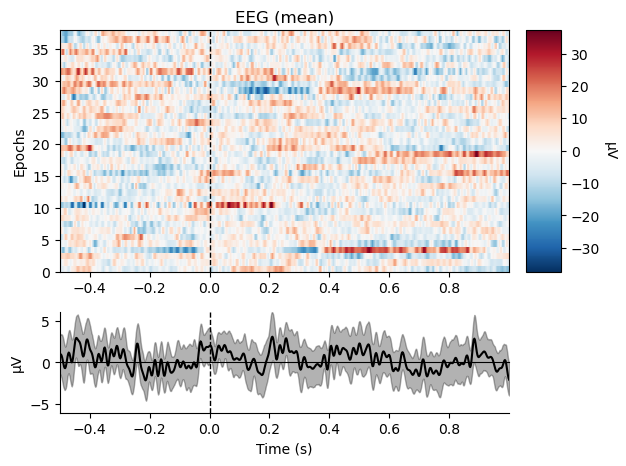

Not setting metadata
38 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


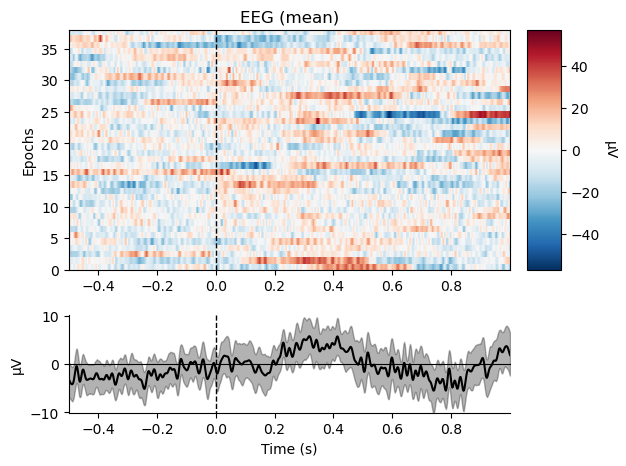

D4->D4
Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


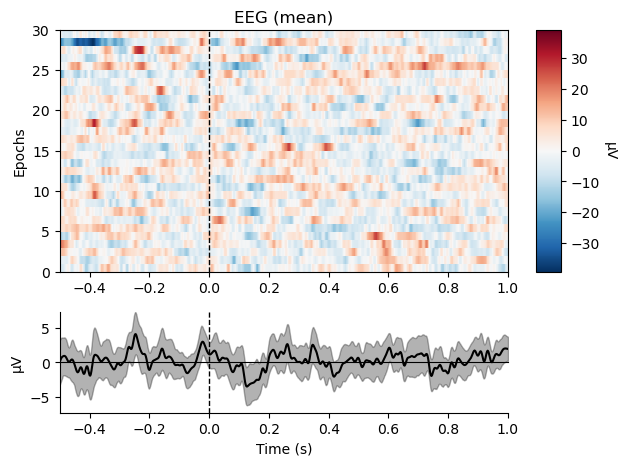

Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


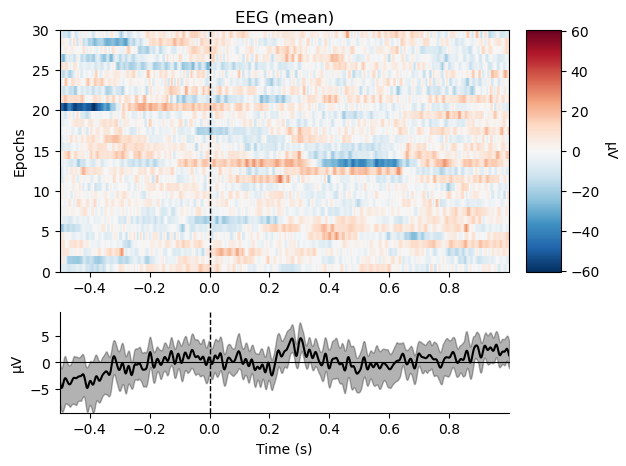

Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


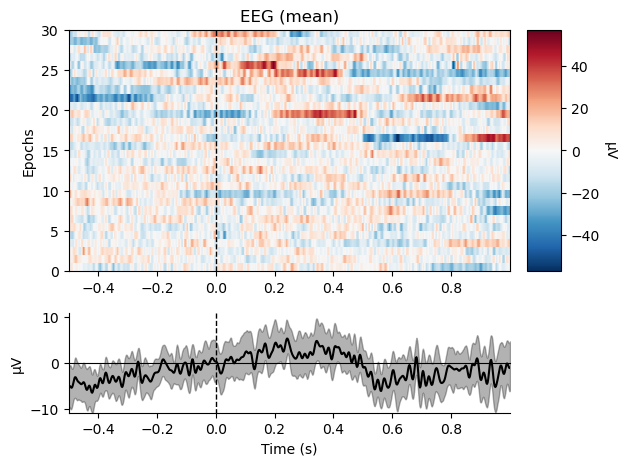

F4->F4
Not setting metadata
29 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


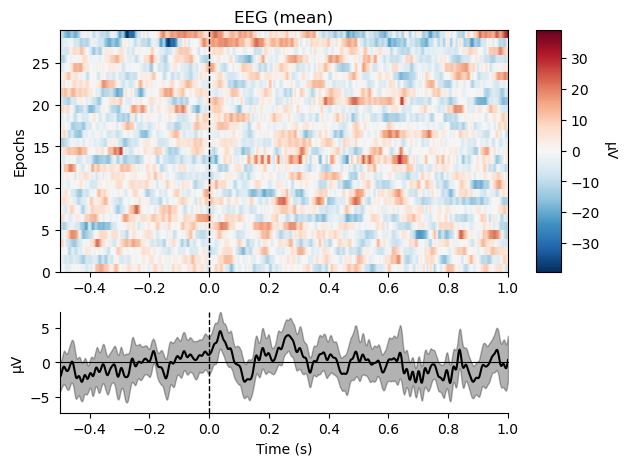

Not setting metadata
29 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


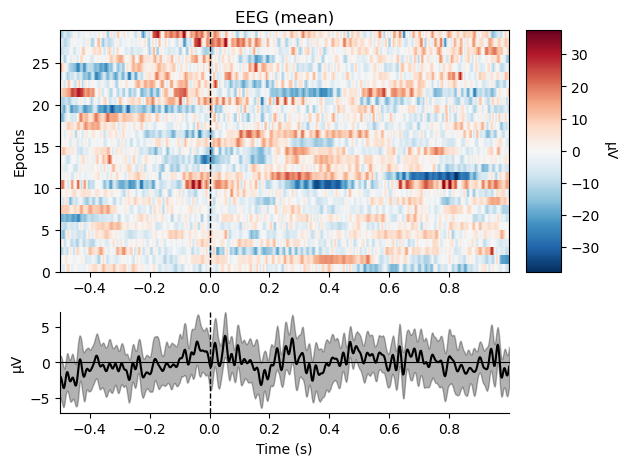

Not setting metadata
29 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


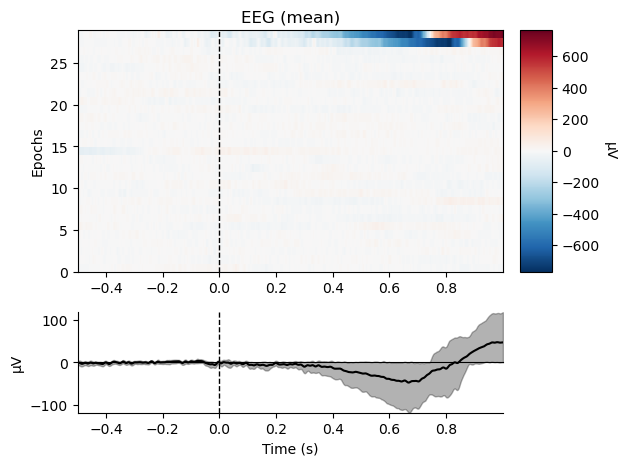

In [59]:
%matplotlib inline

for eid in erp_events:
    print('='*100)
    print(eid)
    for ep in eps:
        ep[eid].plot_image(
            # picks = ['Cz', 'T7', 'T8', 'C3', 'C4', 'CP5', 'CP6'],
            combine='mean'
        )

# Export dataset to EEGLAB

In [ ]:
# uncomment to install eeglabio
# !pip3 install eeglabio

In [ ]:
MAT_PATH = DATA_PATH.split('.xdf')[0] + f'_bpf_{l_freq}-{h_freq}Hz' + '.mat'
MAT_PATH

In [ ]:
# This is a .set file that can be loaded directly into MATLAB (using load)
## Note that this would include any 'bad' channels identified above

try:
    mne.export.export_raw(
        MAT_PATH, 
        raw_filt_drop_bad_rref, 
        fmt='eeglab')
except FileExistsError as e:
    print(e)

# if exporting to EDF:
# Note that the BrainVision format specification supports only µV.
#raw_filt_drop_bad = raw_filt.copy().drop_channels(raw_filt.info['bads'])
#mne.export.export_raw('head_bob-raw_filt-drop_bad_chan.edf', raw_filt_drop_bad, fmt='edf')

# Import ASR'd data

In [ ]:
from scipy.io import loadmat

In [ ]:
after_asr = loadmat('/Volumes/GoogleDrive/.shortcut-targets-by-id/1mvHxk9Ra9K7MmjQxaRYiZKwUw4Y8o841/AC23/DATA/active_piano/sub-matthias/ses-S001/diverse/after_asr.mat')

In [ ]:
clean_data = after_asr['clean_data']
n_chans, n_samples = clean_data.shape

In [ ]:
clean_data

In [ ]:
t_clean_data = after_asr['t_clean_data'][0]
t_clean_data.shape

In [ ]:
n_clean_data = np.int64(t_clean_data * 500)
n_clean_data

In [ ]:
clean_data_full = np.zeros(
    shape=(n_chans, n_clean_data[-1])
)
clean_data_full.shape

In [ ]:
clean_data_full[0, n_clean_data-1]

In [ ]:
clean_data[0].shape

In [ ]:
for ch in range(n_chans):
    clean_data_full[ch][n_clean_data -1] = clean_data[ch]
    
clean_data_full

In [ ]:
clean_ch_names = eeg_ch_names[:16] + eeg_ch_names[16:n_chans]
len(clean_ch_names)

In [ ]:
info = mne.create_info(
    ch_names = clean_ch_names,
    sfreq = 500,
    ch_types = ['eeg'] * n_chans,
)

In [ ]:
raw_asr = mne.io.RawArray(
    clean_data_full / 1e6,
    info = info,
)
raw_asr

In [ ]:
raw_asr[0]

In [ ]:
raw_asr.info.set_montage('standard_1020', match_case=False)

In [ ]:
%matplotlib widget

raw_asr.plot()

In [ ]:
eps_asr = mne.Epochs(
    raw_asr,
    events = events, 
    event_id = event_id, 
    tmin=-0.5,
    tmax=1.5,
    baseline=None,
    event_repeated = 'drop',
)

In [ ]:
for ev_id in erp_event_id:
    print(ev_id)
    
    eps_asr[ev_id].average(
        #picks = ['Cz']
    ).plot_joint(
        #times = [-1.78, -1.38, 0.352, 0.65] #"peaks"
    )

In [ ]:
%matplotlib inline

for ev_id in erp_event_id:
    print(ev_id)
    eps_asr[ev_id].plot_image(
        #picks = [],
        combine='mean'
    )